### Generating Melanoma +ve dataset

In [1]:
import os
PATH = '../../data/train/malignant/'
print(len(os.listdir(PATH)))
import warnings
warnings.simplefilter('ignore')

1197


In [2]:
import tensorflow as tf
import os
import random
import numpy as np

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
physical_devices = tf.config.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(physical_devices[0], True)

In [3]:
physical_devices

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

### VAE

In [4]:
from tensorflow import keras
from tensorflow.keras import layers

class SamplingLayer(layers.Layer):
    """Reparameterization Trick: z = mu + sigma*epsilon"""
    def call(self, inputs):
        z_mean, z_logvar = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5*z_logvar)*epsilon

In [5]:
def build_encoder(latent_dim, encoder_inputs):
    l1 = keras.models.Sequential([
        layers.Conv2D(128, 3, activation='relu', strides=2, padding='same'),
        layers.Conv2D(64, 3, activation='relu', strides=2, padding='same'),
        layers.Flatten(),
        layers.Dense(256, activation='relu'),
    ])
    
    x = l1(encoder_inputs)
    z_mean = layers.Dense(latent_dim, name='z_mean')(x)
    z_logvar = layers.Dense(latent_dim, name='z_logvar')(x)
    z = SamplingLayer()((z_mean, z_logvar))
    return keras.Model(inputs=[encoder_inputs], 
                       outputs=[z_mean, z_logvar, z], name='encoder')

encoder_inputs = keras.Input(shape=(64, 64, 3))
encoder =build_encoder(2, encoder_inputs)
encoder.summary()

Metal device set to: Apple M1
Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 64, 64, 3)]  0           []                               
                                                                                                  
 sequential (Sequential)        (None, 256)          4271936     ['input_1[0][0]']                
                                                                                                  
 z_mean (Dense)                 (None, 2)            514         ['sequential[0][0]']             
                                                                                                  
 z_logvar (Dense)               (None, 2)            514         ['sequential[0][0]']             
                                                              

In [6]:
def build_decoder(latent_inputs):
    l1 = keras.models.Sequential([
        layers.Dense(16*16*64, activation='relu', 
                     input_shape=(latent_inputs.shape[1],)),
        layers.Reshape((16, 16, 64)),
        layers.Conv2DTranspose(128, 3, activation='relu', strides=2, padding='same'),
        layers.Conv2DTranspose(64, 3, activation='relu', strides=2, padding='same'),
        layers.Conv2DTranspose(3, 3, activation='relu', strides=1, padding='same'),
    ])
    return keras.Model(inputs=latent_inputs, outputs=l1(latent_inputs), name='decoder')

latent_inputs = keras.Input(shape=(2,))
decoder = build_decoder(latent_inputs)
decoder.summary()

Model: "decoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 2)]               0         
                                                                 
 sequential_1 (Sequential)   (None, 64, 64, 3)         198531    
                                                                 
Total params: 198,531
Trainable params: 198,531
Non-trainable params: 0
_________________________________________________________________


In [7]:
def reconstructionLoss(data, reconstructed):
    return tf.reduce_mean(
        tf.reduce_sum(
            keras.losses.binary_crossentropy(data, reconstructed), 
            axis=(1, 2)
        )
    )

In [8]:
def KLdivergence(z_mean, z_logvar):
    return tf.reduce_mean(
        tf.reduce_sum(
            -0.5*(1+z_logvar-tf.square(z_mean)-tf.exp(z_logvar)), 
            axis=1
        )
    )

In [9]:
def total_loss_calc(data, reconstructed, z_mean, z_logvar):
    loss1 = reconstructionLoss(data, reconstructed)
    loss2 = KLdivergence(z_mean, z_logvar)
    kl_weight = 3.0
    return loss1, loss2, loss1 + kl_weight*loss2

In [10]:
class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__()
        self.encoder = encoder
        self.decoder = decoder
        self.total_loss_tracker = keras.metrics.Mean(name='total_loss')
        # Reconstruction Loss
        self.ce_loss_tracker = keras.metrics.Mean(name='ce_loss')        
        self.kl_loss_tracker = keras.metrics.Mean(name='kl_loss')
    
    @property
    def metrics(self):
        return [
            self.total_loss_tracker, 
            self.ce_loss_tracker,
            self.kl_loss_tracker
        ]
    
    def train_step(self, data):
        with tf.GradientTape() as tape:
            z_mean, z_logvar, z = self.encoder(data)
            reconstructed = self.decoder(z)
            ce_loss, kl_loss, total_loss = total_loss_calc(
            data, reconstructed, z_mean, z_logvar)
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        
        self.total_loss_tracker.update_state(total_loss)
        self.ce_loss_tracker.update_state(ce_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        
        return {
            'total_loss': self.total_loss_tracker.result(),
            'ce_loss': self.ce_loss_tracker.result(),
            'kl_loss': self.kl_loss_tracker.result(),
        }

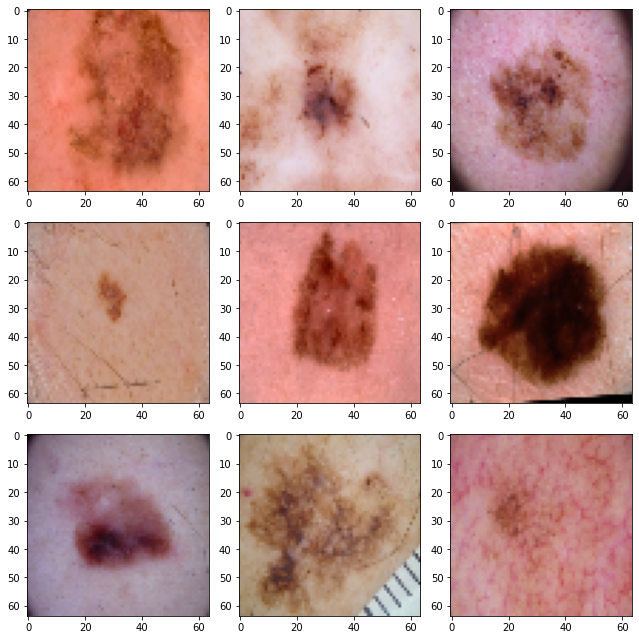

In [11]:
import matplotlib.pyplot as plt
import cv2

X = []
for file in os.listdir(PATH):
    img = plt.imread(PATH+file)
    img = cv2.resize(img, (64, 64),
               interpolation = cv2.INTER_LINEAR)
    X.append(img)

rand_choices = np.random.choice(800, 9)

plt.figure(figsize=(9, 9))
for i in range(9):
    plt.subplot(3,3,i+1)
    plt.imshow(X[rand_choices[i]], cmap='gray')
#     plt.axis('off');
plt.tight_layout()

In [12]:
dataset = np.array(X).astype('float32')/255
# dataset = np.expand_dims(X, -1).astype('float32')/255

In [13]:
dataset.shape

(1197, 64, 64, 3)

In [14]:
vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam())
history = vae.fit(dataset, epochs=45, batch_size=256)

Epoch 1/45
5/5 [==============================] - 2s 409ms/step - total_loss: 13769.3701 - ce_loss: 12647.7725 - kl_loss: 373.8662
Epoch 2/45
5/5 [==============================] - 2s 397ms/step - total_loss: 7011.6968 - ce_loss: 7002.7656 - kl_loss: 2.9773
Epoch 3/45
5/5 [==============================] - 2s 401ms/step - total_loss: 4761.3096 - ce_loss: 4712.6646 - kl_loss: 16.2150
Epoch 4/45
5/5 [==============================] - 2s 402ms/step - total_loss: 3598.3691 - ce_loss: 3572.8845 - kl_loss: 8.4948
Epoch 5/45
5/5 [==============================] - 2s 405ms/step - total_loss: 3317.2898 - ce_loss: 3298.9746 - kl_loss: 6.1051
Epoch 6/45
5/5 [==============================] - 2s 405ms/step - total_loss: 3191.4119 - ce_loss: 3185.4114 - kl_loss: 2.0001
Epoch 7/45
5/5 [==============================] - 2s 401ms/step - total_loss: 3127.4619 - ce_loss: 3122.3916 - kl_loss: 1.6901
Epoch 8/45
5/5 [==============================] - 2s 398ms/step - total_loss: 3040.3748 - ce_loss: 3036.63

In [15]:
Z = np.random.normal(loc=0, scale=3.0, size=(9, 2))
print(Z.shape)
synth = vae.decoder.predict(Z)
synth.shape

(9, 2)


(9, 64, 64, 3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


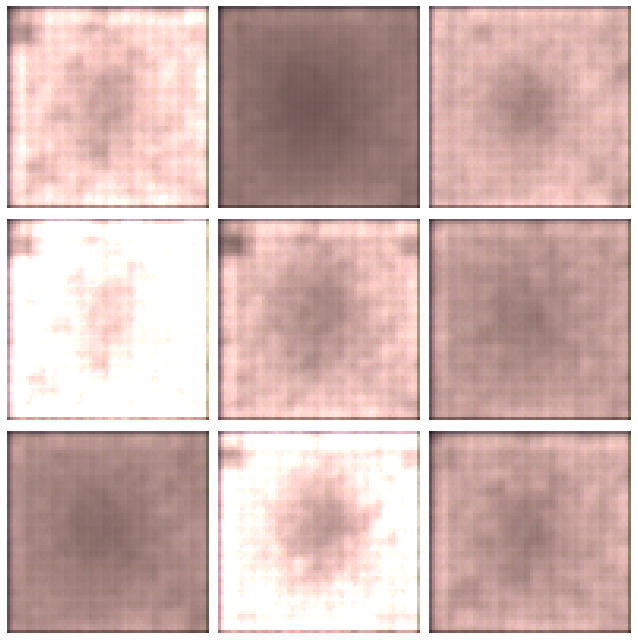

In [16]:
plt.figure(figsize=(9, 9))
for i in range(9):
    plt.subplot(3,3,i+1)
    plt.imshow(synth[i])
    plt.axis('off');
plt.tight_layout()

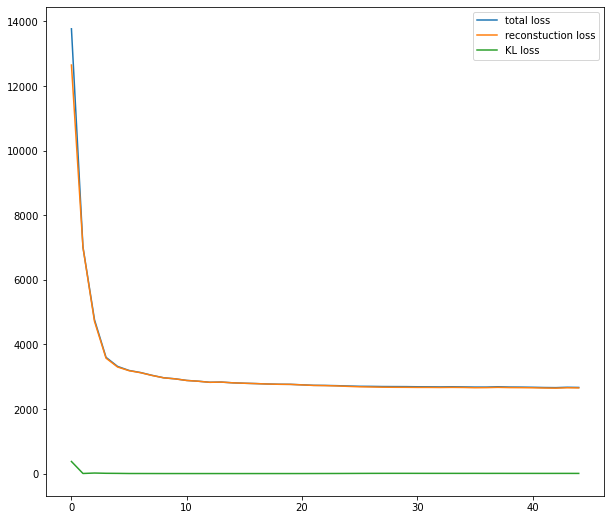

In [17]:
plt.figure(figsize=(10, 9))
plt.plot(history.history['total_loss'], label='total loss')
plt.plot(history.history['ce_loss'], label='reconstuction loss')
plt.plot(history.history['kl_loss'], label='KL loss')
plt.legend();

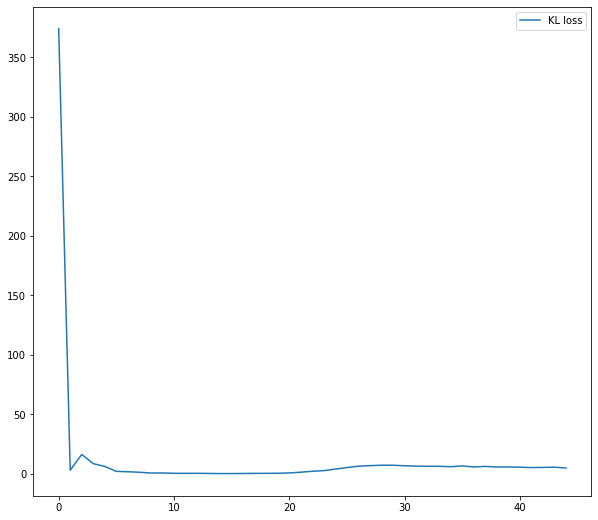

In [18]:
plt.figure(figsize=(10, 9))
plt.plot(history.history['kl_loss'], label='KL loss')
plt.legend();

### GANs

In [19]:
BATCH_SIZE = 32
dataset = np.array(X).astype('float32')/255
dataset = np.reshape(dataset, (-1, 64, 64, 3))
dataset = tf.data.Dataset.from_tensor_slices(dataset)
dataset = dataset.shuffle(buffer_size=1024).batch(BATCH_SIZE)

In [20]:
from tensorflow import keras
from tensorflow.keras import layers

NOISE_DIM = 150

generator = keras.models.Sequential([
    keras.layers.InputLayer(input_shape=(NOISE_DIM,)),
    layers.Dense(16*16*256),
    layers.Reshape(target_shape=(16, 16, 256)),
    layers.Conv2DTranspose(256, 3, activation='LeakyReLU', strides=2, padding='same'),
    layers.Conv2DTranspose(128, 3, activation='LeakyReLU', strides=2, padding='same'),
    layers.Conv2DTranspose(3, 3, activation='sigmoid', padding='same')
])

generator.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 65536)             9895936   
                                                                 
 reshape_1 (Reshape)         (None, 16, 16, 256)       0         
                                                                 
 conv2d_transpose_3 (Conv2DT  (None, 32, 32, 256)      590080    
 ranspose)                                                       
                                                                 
 conv2d_transpose_4 (Conv2DT  (None, 64, 64, 128)      295040    
 ranspose)                                                       
                                                                 
 conv2d_transpose_5 (Conv2DT  (None, 64, 64, 3)        3459      
 ranspose)                                                       
                                                      

In [21]:
discriminator = keras.models.Sequential([
    keras.layers.InputLayer(input_shape=(64, 64, 3)),
    layers.Conv2D(256, 3, strides=2, padding='same', activation='relu'),
    layers.Conv2D(128, 3, strides=2, padding='same', activation='relu'),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dropout(0.2),
    layers.Dense(1, activation='sigmoid')
])

discriminator.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 32, 32, 256)       7168      
                                                                 
 conv2d_3 (Conv2D)           (None, 16, 16, 128)       295040    
                                                                 
 flatten_1 (Flatten)         (None, 32768)             0         
                                                                 
 dense_3 (Dense)             (None, 64)                2097216   
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_4 (Dense)             (None, 1)                 65        
                                                                 
Total params: 2,399,489
Trainable params: 2,399,489
No

In [22]:
optimizerG = keras.optimizers.Adam(learning_rate=0.00001, beta_1=0.5)
optimizerD = keras.optimizers.Adam(learning_rate=0.00003, beta_1=0.5)

loss_fn = keras.losses.BinaryCrossentropy(from_logits=True)

accG = tf.keras.metrics.BinaryAccuracy()
accD = tf.keras.metrics.BinaryAccuracy()

In [23]:
@tf.function
def train_discriminator(data):
    batchsize = tf.shape(data)[0]
    noise = tf.random.normal(shape=(batchsize, NOISE_DIM))
    y_true = tf.concat(
        [
            # the original data is real, labeled with 1
            tf.ones(batchsize, 1),
            # the forged data is fake, labeled with 0
            tf.zeros(batchsize, 1)
        ], 
        axis=0
    )
    with tf.GradientTape() as tape:
        fake = generator(noise)
        x = tf.concat([data, fake], axis=0)
        y_pred = discriminator(x)
        discriminator_loss = loss_fn(y_true, y_pred)
    
    grads = tape.gradient(discriminator_loss, discriminator.trainable_weights)
    optimizerD.apply_gradients(zip(grads, discriminator.trainable_weights))
    
    accD.update_state(y_true, y_pred)
    
    return {
        'discriminator_loss': discriminator_loss,
        'discriminator_acc': accD.result()
    }

In [24]:
@tf.function
def train_generator(data):
    batchsize = tf.shape(data)[0]
    noise = tf.random.normal(shape=(batchsize, NOISE_DIM))
    y_true = tf.ones(batchsize, 1)
    with tf.GradientTape() as tape:
        y_pred = discriminator(generator(noise))
        generator_loss = loss_fn(y_true, y_pred)
    grads = tape.gradient(generator_loss, generator.trainable_weights)
    optimizerG.apply_gradients(zip(grads, generator.trainable_weights))
    accG.update_state(y_true, y_pred)
    return {
        'generator_loss': generator_loss,
        'generator_acc': accG.result()
    }

In [25]:
from matplotlib import pyplot as plt

def plot_image(model):
    images = model(np.random.normal(size=(81, NOISE_DIM)))
    plt.figure(figsize=(9, 9))
    for i, image in enumerate(images):
        plt.subplot(9, 9, 1+i)
        plt.imshow(image, cmap='gray')
        plt.axis('off');
    plt.show();

Epoch [1/30]: Loss G: 0.5535; Acc G: 0.00; Loss D: 0.6795; Acc D: 51.85


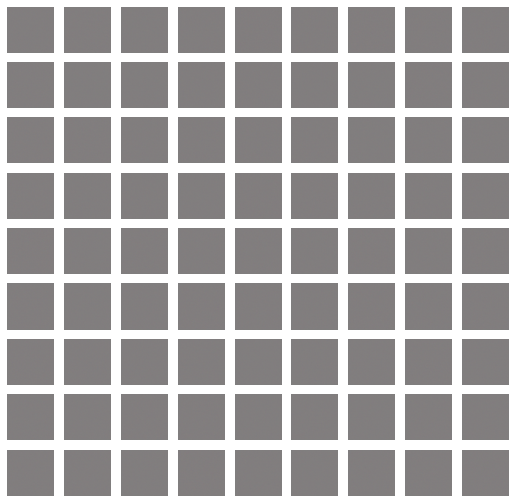

Epoch [2/30]: Loss G: 0.6412; Acc G: 0.00; Loss D: 0.5675; Acc D: 70.16


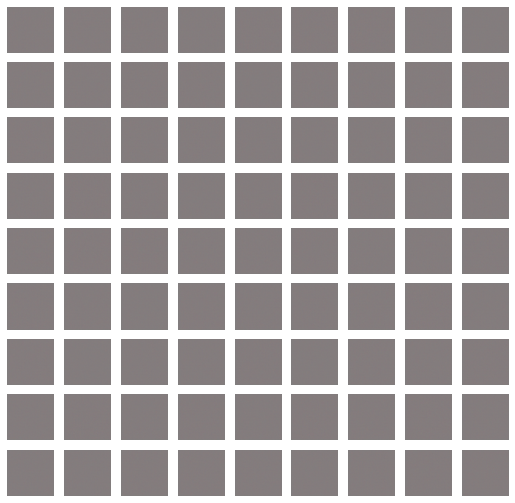

Epoch [3/30]: Loss G: 0.6694; Acc G: 0.00; Loss D: 0.5352; Acc D: 80.23


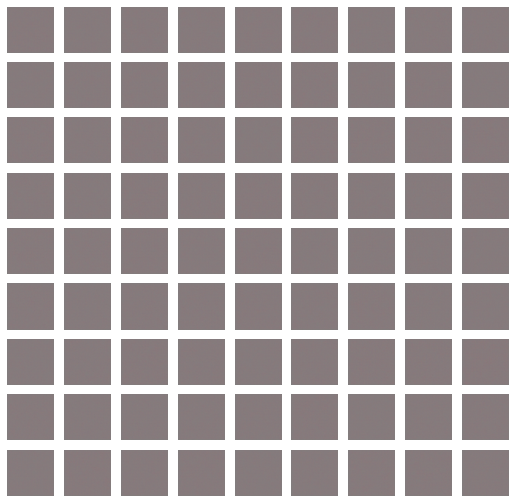

Epoch [4/30]: Loss G: 0.6757; Acc G: 0.00; Loss D: 0.5290; Acc D: 84.75


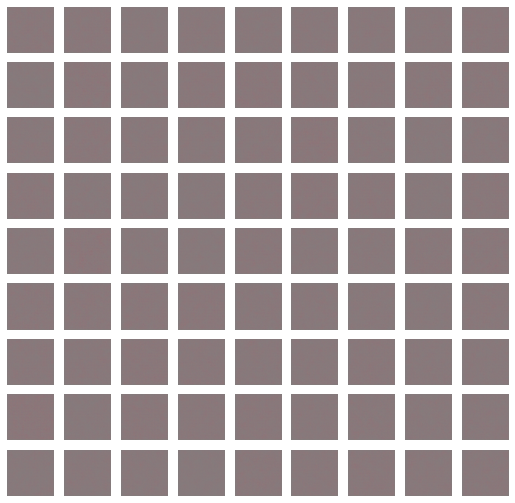

Epoch [5/30]: Loss G: 0.6728; Acc G: 0.01; Loss D: 0.5351; Acc D: 87.23


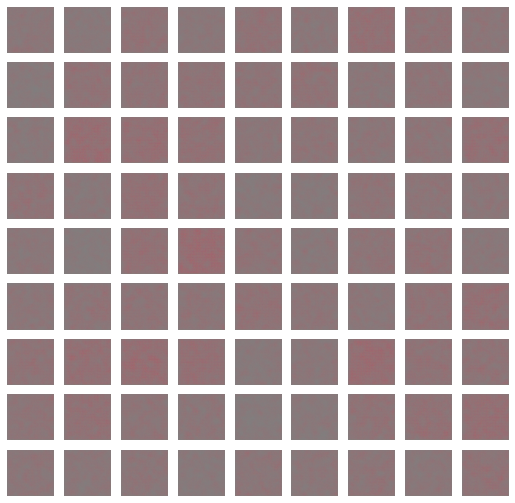

Epoch [6/30]: Loss G: 0.6546; Acc G: 0.40; Loss D: 0.5678; Acc D: 87.94


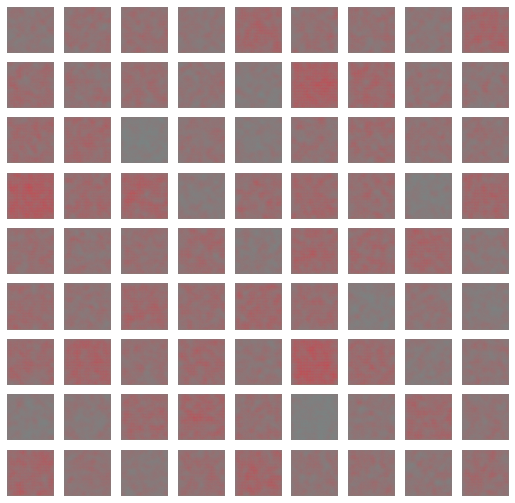

Epoch [7/30]: Loss G: 0.6288; Acc G: 1.28; Loss D: 0.5830; Acc D: 87.64


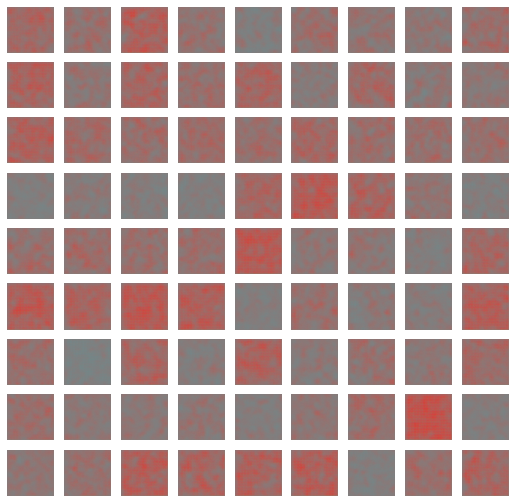

Epoch [8/30]: Loss G: 0.5876; Acc G: 3.10; Loss D: 0.6202; Acc D: 86.89


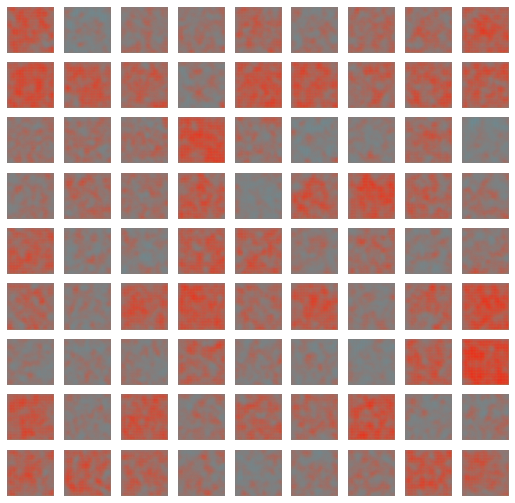

Epoch [9/30]: Loss G: 0.5916; Acc G: 5.19; Loss D: 0.6373; Acc D: 85.46


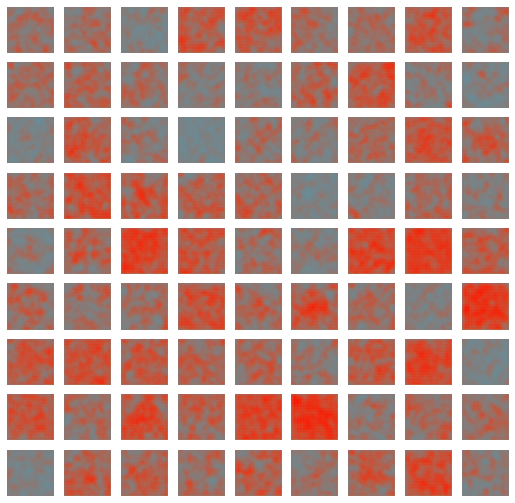

Epoch [10/30]: Loss G: 0.6201; Acc G: 6.30; Loss D: 0.6098; Acc D: 84.31


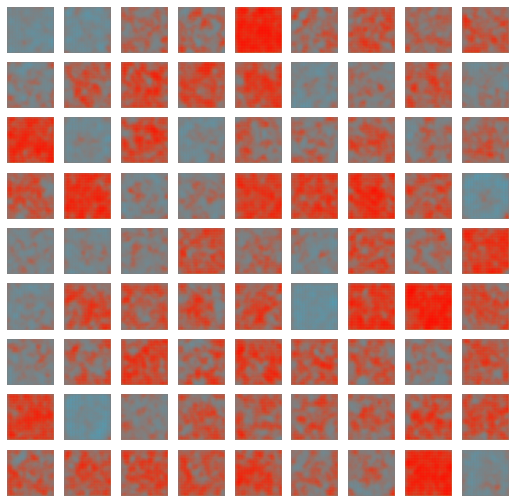

Epoch [11/30]: Loss G: 0.6499; Acc G: 6.32; Loss D: 0.5674; Acc D: 84.26


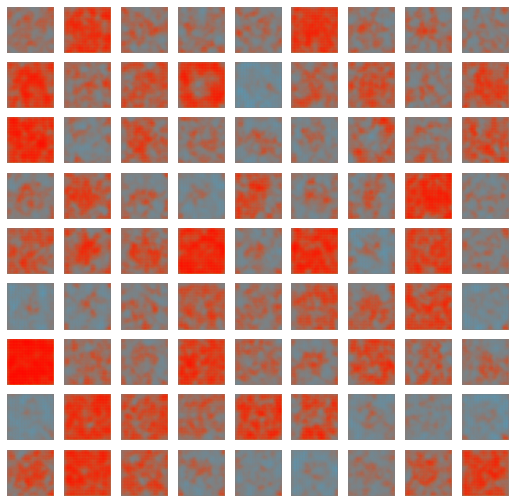

Epoch [12/30]: Loss G: 0.6620; Acc G: 5.99; Loss D: 0.5539; Acc D: 84.70


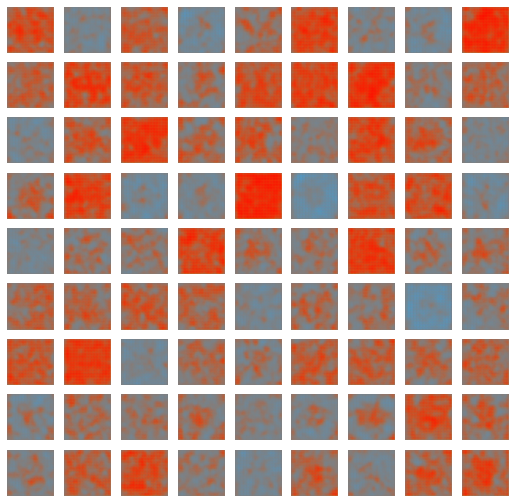

Epoch [13/30]: Loss G: 0.6692; Acc G: 5.57; Loss D: 0.5354; Acc D: 85.41


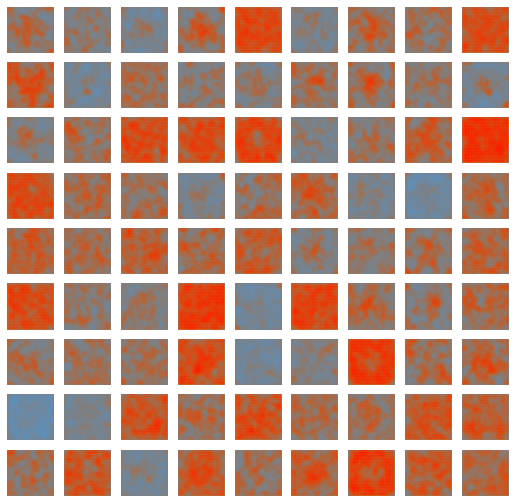

Epoch [14/30]: Loss G: 0.6748; Acc G: 5.15; Loss D: 0.5265; Acc D: 86.19


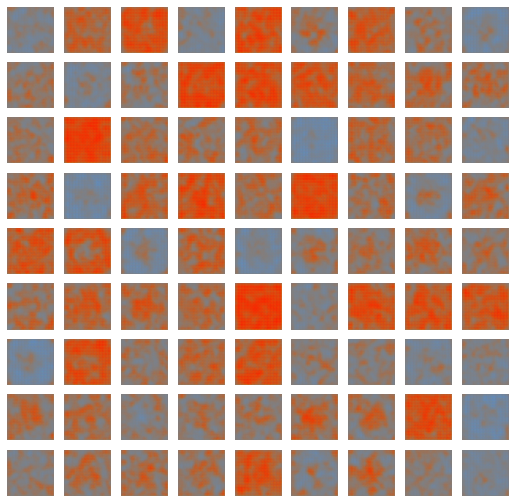

Epoch [15/30]: Loss G: 0.6789; Acc G: 4.80; Loss D: 0.5226; Acc D: 86.94


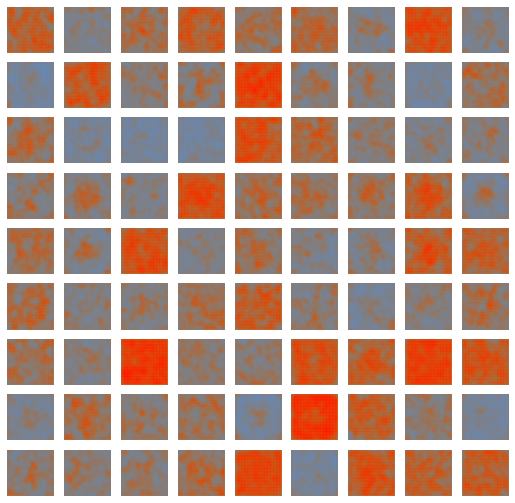

Epoch [16/30]: Loss G: 0.6796; Acc G: 4.49; Loss D: 0.5195; Acc D: 87.64


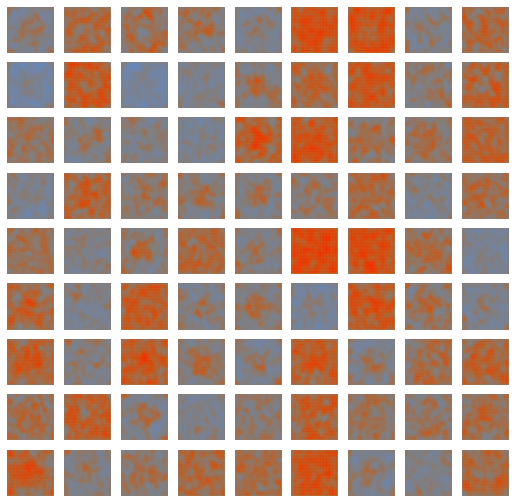

Epoch [17/30]: Loss G: 0.6825; Acc G: 4.22; Loss D: 0.5177; Acc D: 88.27


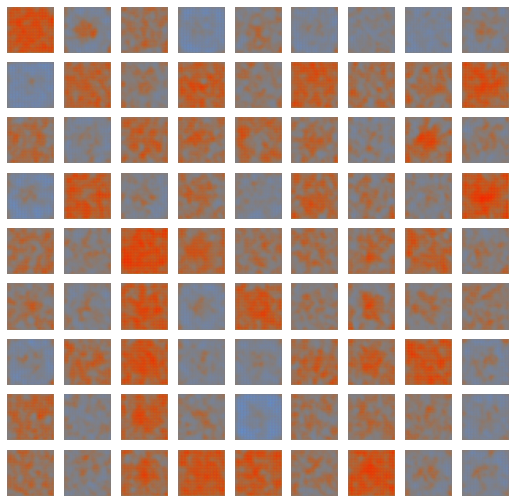

Epoch [18/30]: Loss G: 0.6838; Acc G: 3.98; Loss D: 0.5161; Acc D: 88.83


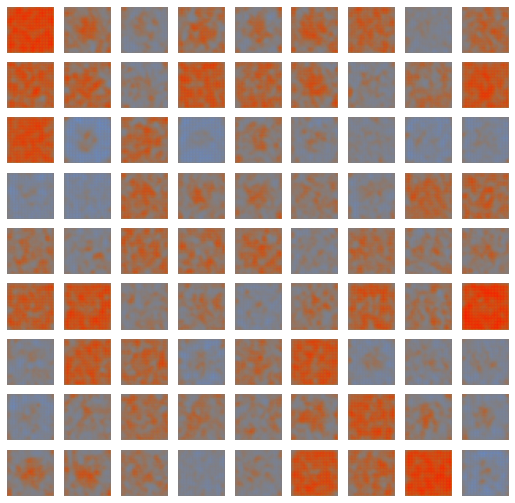

Epoch [19/30]: Loss G: 0.6835; Acc G: 3.76; Loss D: 0.5154; Acc D: 89.35


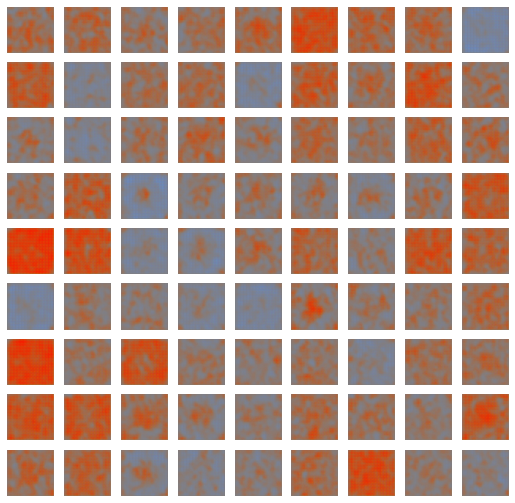

Epoch [20/30]: Loss G: 0.6840; Acc G: 3.57; Loss D: 0.5143; Acc D: 89.83


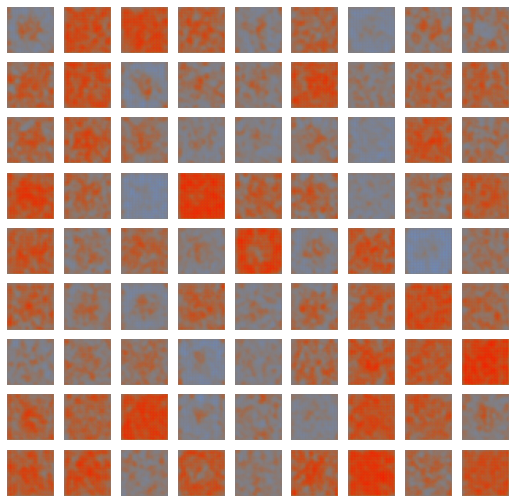

Epoch [21/30]: Loss G: 0.6824; Acc G: 3.39; Loss D: 0.5179; Acc D: 90.26


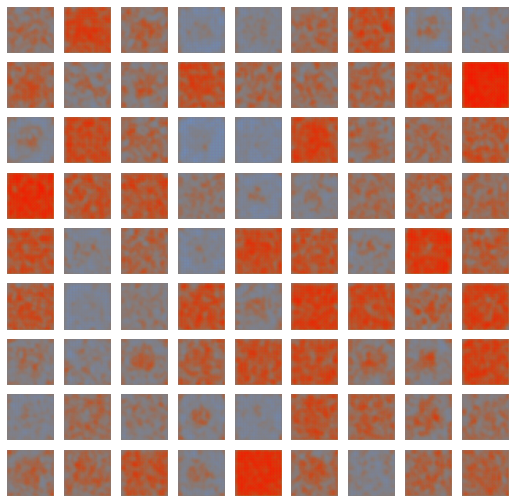

Epoch [22/30]: Loss G: 0.6847; Acc G: 3.24; Loss D: 0.5143; Acc D: 90.63


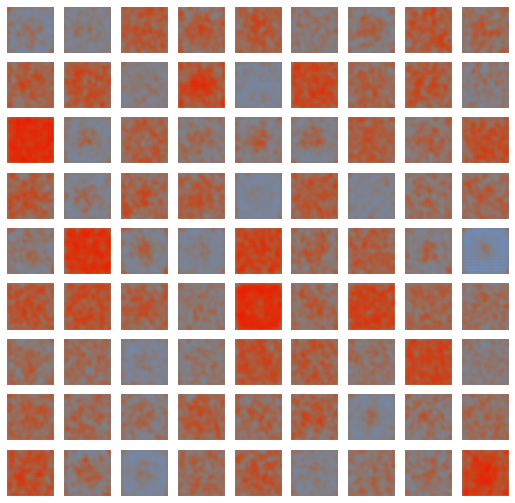

Epoch [23/30]: Loss G: 0.6846; Acc G: 3.10; Loss D: 0.5133; Acc D: 91.00


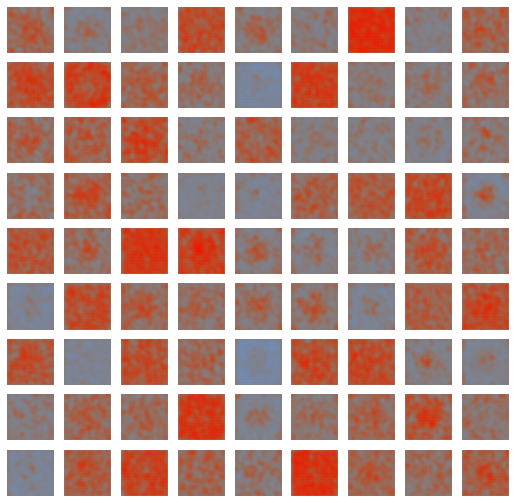

Epoch [24/30]: Loss G: 0.6844; Acc G: 2.96; Loss D: 0.5152; Acc D: 91.32


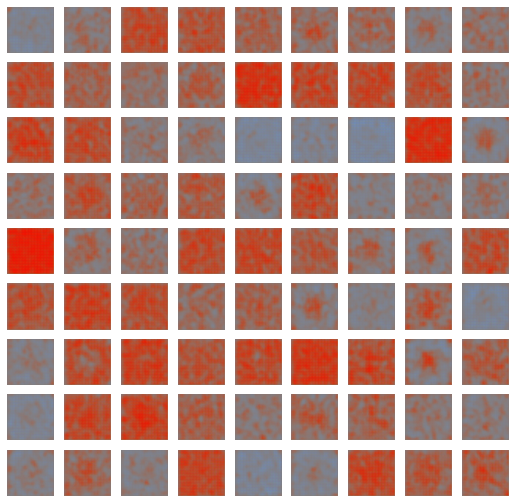

Epoch [25/30]: Loss G: 0.6855; Acc G: 2.84; Loss D: 0.5138; Acc D: 91.61


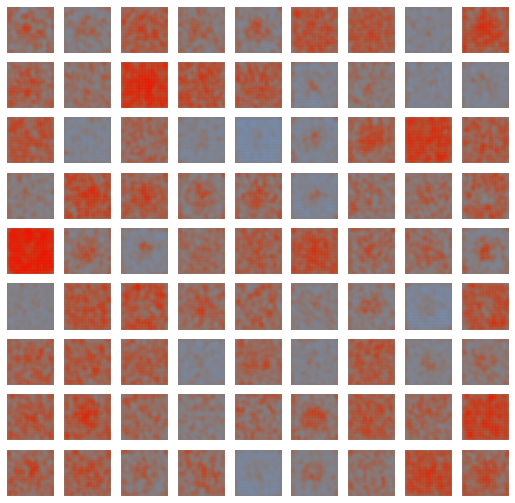

Epoch [26/30]: Loss G: 0.6872; Acc G: 2.73; Loss D: 0.5124; Acc D: 91.89


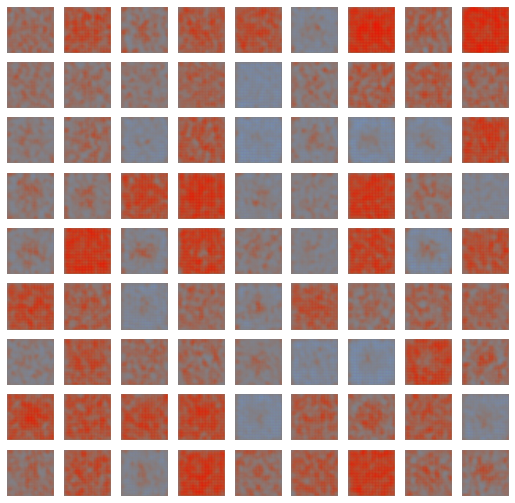

Epoch [27/30]: Loss G: 0.6864; Acc G: 2.63; Loss D: 0.5120; Acc D: 92.16


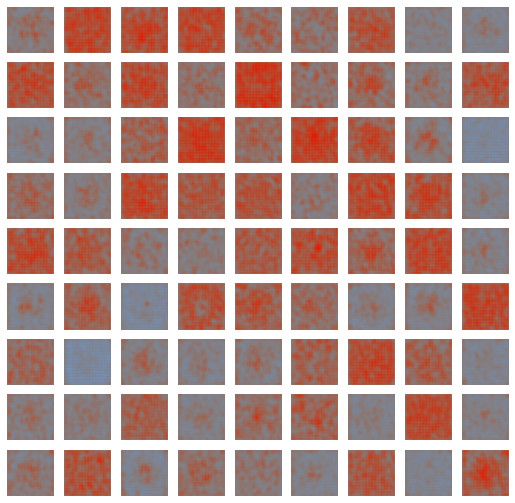

Epoch [28/30]: Loss G: 0.6870; Acc G: 2.54; Loss D: 0.5117; Acc D: 92.41


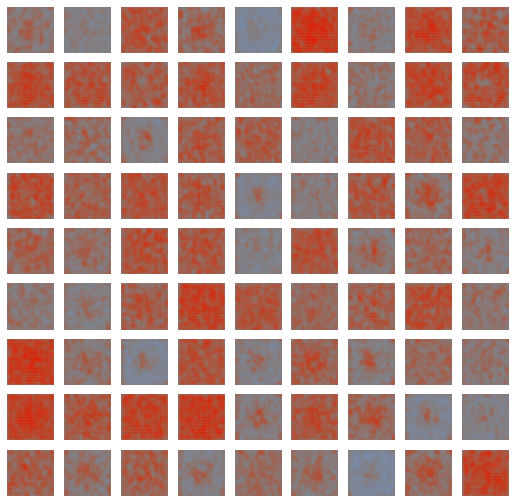

Epoch [29/30]: Loss G: 0.6879; Acc G: 2.45; Loss D: 0.5101; Acc D: 92.64


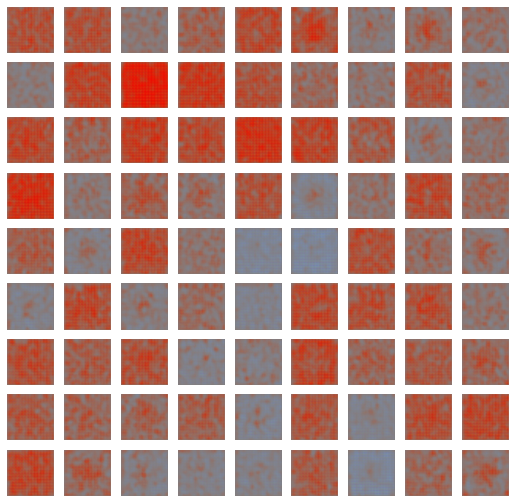

Epoch [30/30]: Loss G: 0.6876; Acc G: 2.36; Loss D: 0.5118; Acc D: 92.86


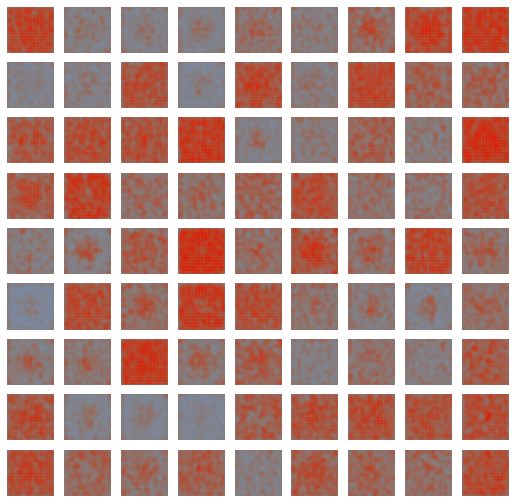

In [26]:
for epoch in range(30):
    lossD = 0
    lossG = 0
    acc_d = 0
    acc_g = 0
    cnt = 0
    
    for batch in dataset:
        
        loss = train_discriminator(batch)
        lossD += loss['discriminator_loss']
        acc_d += loss['discriminator_acc']
        
        loss = train_generator(batch)
        lossG += loss['generator_loss']
        acc_g += loss['generator_acc']
        
        cnt += 1
        
    print(f'Epoch [{epoch+1}/30]: Loss G: {lossG/cnt:.4f}; Acc G: {100*acc_g/cnt:.2f}; Loss D: {lossD/cnt:.4f}; Acc D: {100*acc_d/cnt:.2f}')
    
    plot_image(generator)

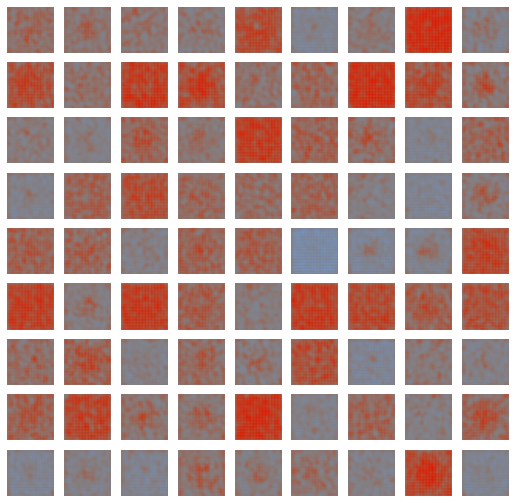

In [27]:
plot_image(generator)